<a href="https://colab.research.google.com/github/ssanudo/ProcesamDigImagTP/blob/main/TP7/PDI_TP7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Procesamiento morfológico
Las operaciones morfológicas simplifican imágenes y conservan las principales características de forma de los objetos. Un sistema de operadores de este tipo y su composición, permite que las formas subyacentes sean identificadas y reconstruidas de forma óptima a partir de sus formas distorsionadas y ruidosas.

La morfología matemática se puede usar, entre otros, con los
siguientes objetivos:

* Pre-procesamiento de imágenes (supresión de ruidos, simplificación de formas).
* Destacar la estructura de los objetos (extraer el esqueleto, detección de objetos, envolvente convexa, ampliación, reducción,...)
* Descripción de objetos (área, perímetro,...)




1. Imágenes binarias

  * Operaciones morfológicas: Dilatación, erosión, Transformada Hit-or-Miss, apertura y cierre.
  * Aplicaciones: Extracción de fronteras y componentes conexas, rellenado de
regiones, adelgazamiento y engrosamiento, esqueleto y poda.

2.  Imágenes en escala de grises
  * Operaciones morfológicas: dilatación, erosión, apertura, cierre.
  * Aplicaciones: Gradiente morfológico, transformada Top-Hat, texturas y
granulometrías.

## Operaciones

* La dilatación consiste en apoyar el elemento estructural sobre cada punto dentro la figura, y todos los nuevos puntos alcanzados (que antes estaban en el fondo) pasan ahora a la figura.
Dilatación del conjunto A por un elemento estructural B, $A⊕B=\{x:\widehat{B}_x\bigcap_{}A\not\equiv ∅\}$.

* La erosión consiste en apoyar el elemento estructural sobre cada punto fuera de la figura, y todos los puntos alcanzados (que antes estaban en la figura) pasan ahora al fondo.
Erosión del conjunto A por el elemento estructural B $A⊖B=\{x:Bx⊆A\},$ donde Bx es el trasladado de B.
El resultado de la erosión es un conjunto que contiene aquellos puntos $x∈Rn$ tales que B esta propiamente contenido en A cuando su centro se coloca en x.

En el presente trabajo se utiliza como elemento estructural una matriz de 3 x 3.
https://repositorioinstitucional.buap.mx/handle/20.500.12371/6921
http://pteam.pixinsight.com/carlos/I_Cap7.pdf


En los links se pueden encontrar las operaciones explicadas en detalle matemáticamente, y con gráficos.

En el presente trabajo las operaciones consisten en:

* Erosión: Toma el mínimo valor de luminancia de la vecindad y replicarlo en todo el espacio que ocupa el elemento estructural.
* Dilatación: Tomar el máximo valor de luminancia de la vecindad y replicarlo en todo el espacio que ocupa el elemento estructural.
* Apertura:Erosión --> Dilatación
* Cierre: Dilatación --> Erosión
* Borde morfológico:
  * Frontera interna: Original - Erosión
  * Frontera externa: Dilatación - Original
* Mediana: Es la mediana entre la luminancia de los 9 píxels ordenados, en el lugar del píxel central del elemento estructural.
* Top-hat: Original - Apertura





In [ ]:
#TP7 PROCESAMIENTO MORFOLÓGICO
Desarrollar un aplicativo que permita abrir una imagen y automáticamente convertirla a niveles de grises (en caso de no estarlo) y visualizarla. 
Con esta imagen se aplicarán los siguientes filtros morfológicos, los cuales deben poderse seleccionar de una lista:
* Erosión (tomar el mínimo valor de luminancia de la vecindad).
* Dilatación (máximo)
* Apertura
* Cierre
* Borde morfológico (frontera interna y externa)
* Mediana
* Top-hat
El elemento estructurante será de una ventana de 3x3 pixeles.
El aplicativo debe incluir una función de copiado de la imagen procesada, de tal manera que esta pueda tomarse como imagen de entrada para así poder aplicar dos o más filtros en secuencia.
El resultado del filtro debe poder guardarse como una nueva imagen en nivel de grises.
Adicionalmente se debe mostrar un plot con el resultado respectivo para cada uno de los filtros indicados.
Nota: La función que desarrollaron para la convolución es la misma que pueden usar para recorrer toda la imagen y aplicar el filtro morfológico.
FECHA DE ENTREGA: 26 DE NOVIEMBRE

#**Librerías**

In [2]:
import imageio
from scipy import fftpack as fp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

import ipywidgets as widgets
from IPython.display import display


In [ ]:
#Funciones

In [10]:
#Funciones

def ImgShapeShow(im):#muestra datos de forma del arreglo obtenido de las imágenes
  print('Tamaño del arreglo',im.shape, 'donde', im.shape[0], 'x',im.shape[1],'es el tamaño de la imágen en píxeles, y ',im.shape[2], 'es el valor RGB de cada uno de dichos píxeles' )
  

def RGB2Y(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  return im_YIQ[:,:,0]
  

def open_img2lum(file_path):#Abre la imágen, y devuelve su luminancia
  im=imageio.imread(file_path)
  ImgShapeShow(im)
  if (im.shape[2]==4):im=im[:,:,0:3]
  im = im.astype(np.int)
  Yim=RGB2Y(im)
  return Yim




def open_img(file_path):#Abre la imágen, y muestra datos de forma
  im=imageio.imread(file_path)
  ImgShapeShow(im)
  if (im.shape[2]==4):im=im[:,:,0:3]
  im = im.astype(np.int)
  return im

def save_img(im,imgName): #guarda la imagen con el nombre imgName
  imgName=imgName+'.png'
  imageio.imwrite(imgName, im.astype(np.uint8))

def normalizeRGB(x):return np.array((x - 0) / (255))
#Normaliza [0-255] RGB de la imagen en el rango [0,1], x es el arreglo de RGB de la img.

def normalizeY(y,yMin,yMax):return np.array((y - yMin) / (yMax-yMin))
#Normaliza y, lo estira, a [0,1], y es el arreglo de Luminancia de la img.


#Defino las matrices de conversión, de RGB a YIQ y viseversa.
rgb2yiq=np.array([[0.299,0.587,0.114],[0.595716,-0.274453,-0.321263],[0.211456,-0.522591,0.311135]])
#print(rgb2yiq)
yiq2rgb=np.array([[1,0.9663,0.621],[1,-0.2721,-0.6474],[1,-1.1070,1.7046]])
#print(yiq2rgb)


def RGB2YIQ(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  im_YIQ[:,:,1][im_YIQ[:,:,1]<-0.5957]=-0.5957
  im_YIQ[:,:,1][im_YIQ[:,:,1]>0.5957]=0.5957
  im_YIQ[:,:,2][im_YIQ[:,:,2]<-0.5226]=-0.5226
  im_YIQ[:,:,2][im_YIQ[:,:,2]>0.5226]=0.5226
  #Vuelvo a RGB normalizado
  YIQcFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  YIQcFin=YIQcFin*255
  ImC=YIQcFin.astype(np.int)
  return im_YIQ

def YIQ2RGB(im_YIQ):
  #Vuelvo a RGB normalizado
  RGBFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  RGBFin=RGBFin*255
  ImC=RGBFin.astype(np.int)
  return ImC

def RGB2Y(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  #Vuelvo a RGB normalizado
  YIQcFin=np.dot(im_YIQ, yiq2rgb.T)
  #Desnormalizo
  YIQcFin=YIQcFin*255
  ImC=YIQcFin.astype(np.int)
  return ImC
  #return im_YIQ[:,:,0]

def RGB2Y_01(im,thresh): #función que convierte de RGB a YIQ de una imágen, binarizada 0 y 1
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=thresh]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<thresh]=0
  #Vuelvo a RGB normalizado
  
  return im_YIQ[:,:,0]

def RGB2Y_crudo(im): #función que convierte de RGB a YIQ de una imágen
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  im_YIQ=np.dot(imNorm, rgb2yiq.T)
  im_YIQ[:,:,0][im_YIQ[:,:,0]>=1]=1
  im_YIQ[:,:,0][im_YIQ[:,:,0]<0]=0
  return im_YIQ[:,:,0]
  

def LoadScaleImg(path): #Cargo y escalo img
  #escalo RGB a 0-1
  im = np.clip(imageio.imread(path)/255.,0.,1.)
  return im




#==============================================================================
#==============================================================================
def ImgMediana(Yimg):
     #Genera la convolución con una matriz cuadrada como kernel
    EE=[[1,1,1],[1,1,1],[1,1,1]]
    EE_size = len(EE)
    row = Yimg.shape[0] - EE_size + 1
    col = Yimg.shape[1] - EE_size + 1
    ImFiltr= Yimg.copy()
    for i in range(row):
        for j in range(col):
            current = Yimg[i:i+EE_size, j:j+EE_size]
            multiplication = current 
            e=np.array(multiplication).flatten()
            e2=np.sort(e)
            CoefMin=np.median(e2)
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)] =CoefMin
            
    return ImFiltr

def ImgErosion(Yimg):
     #Genera la convolución con una matriz cuadrada como kernel
    EE=[[1,1,1],[1,1,1],[1,1,1]]
    EE_size = len(EE)
    row = Yimg.shape[0] - EE_size + 1
    col = Yimg.shape[1] - EE_size + 1
    ImFiltr= Yimg.copy()
    for i in range(row):
        for j in range(col):
            current = Yimg[i:i+EE_size, j:j+EE_size]
            multiplication = current 
            CoefMin=multiplication.min()
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)+1] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)+1] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)+1] =CoefMin
    return ImFiltr

def ImgDilat(Yimg):
     #Genera la convolución con una matriz cuadrada como kernel
    EE=[[1,1,1],[1,1,1],[1,1,1]]
    EE_size = len(EE)
    row = Yimg.shape[0] - EE_size + 1
    col = Yimg.shape[1] - EE_size + 1
    ImFiltr= Yimg.copy()
    for i in range(row):
        for j in range(col):
            current = Yimg[i:i+EE_size, j:j+EE_size]
            multiplication = current
            #print('',multiplication)
            CoefMin=multiplication.max()
            #print(CoefMin)
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)] =CoefMin
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2), j+int(EE_size/2)+1] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2)-1, j+int(EE_size/2)+1] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)-1] =CoefMin
            ImFiltr[i+int(EE_size/2)+1, j+int(EE_size/2)+1] =CoefMin
    return ImFiltr

def RestaImg(img1,img2):
   img=np.subtract(img1,img2)
   #img[img>=1]=1
   #img[img<0]=0
   return img

    

def DoProcesamMorfologico(OpMorf, Img): #Fcn que permite llevar a cabo las operaciones entre imágenes requeridas en la interfaz
#'Dilatación 3x3'","'Erosión 3x3'" , "'Apertura'","'Cierre'","'Frontera 3x3'","'Borde Interior'", "'Borde Exterior'","'Gradiente'","'Top Hat'","'Mediana 3x3'
  if (OpMorf=='Dilatación 3x3'):
    FilteredImg=ImgDilat(Img)
  elif (OpMorf=='Erosión 3x3'):
    FilteredImg=ImgErosion(Img)
  elif (OpMorf=='Apertura'):
    Img1=ImgErosion(Img)
    FilteredImg=ImgDilat(Img1)
  elif (OpMorf=='Cierre'):
    Img1=ImgDilat(Img)
    FilteredImg=ImgErosion(Img1)
  #elif (OpMorf=='Frontera 3x3'):
  elif (OpMorf=='Borde Interior'):
    Img1=ImgErosion(Img)
    FilteredImg=RestaImg(Img,Img1)
  elif (OpMorf=='Borde Exterior'):
    Img1=ImgDilat(Img)
    FilteredImg=RestaImg(Img1,Img)
  elif (OpMorf=='Gradiente'): 
    Img1=ImgDilat(Img)
    Img2=ImgErosion(Img)
    FilteredImg=RestaImg(Img1,Img2)
  elif (OpMorf=='Top Hat'):
    Img1=ImgErosion(Img)
    Img2=ImgDilat(Img1)
    FilteredImg=RestaImg(Img,Img2)
  elif (OpMorf=='Mediana 3x3'):
    FilteredImg=ImgMediana(Img)
  else:
     print('No es un valor válido')
  return FilteredImg

#**Aplicación**

1. Para cumplir con el objetivo se generó una función que pasa la imágen de tonos de gris a binaria (Luminancia 0 ó 1). RGB2Y_01(im,thresh) requiere que se ingrese, además de la imágen, un valor threshold (entre 0 y 1) para determinar a partir de qué valor de luminancia es considerado 1.
2. En la **primer parte** del aplicativo se puede **subir cualquier imágen** a procesar, en la **segunda parte** se selecciona la operación morfológica a aplicar y se define el nombre del archivo en caso de que se quiera **guardar**. Para guardar la imágen solo se debe apretar el botón celeste. 
En caso de querer utilizar nuevamente la **imágen guardada**, se debe subir en la **primer parte** del aplicativo.

#Primer parte: Subir imágen

Tamaño del arreglo (383, 569, 4) donde 383 x 569 es el tamaño de la imágen en píxeles, y  4 es el valor RGB de cada uno de dichos píxeles
Tamaño del arreglo (383, 569, 4) donde 383 x 569 es el tamaño de la imágen en píxeles, y  4 es el valor RGB de cada uno de dichos píxeles


Text(0.5, 1.0, 'Imágen Luminancias')

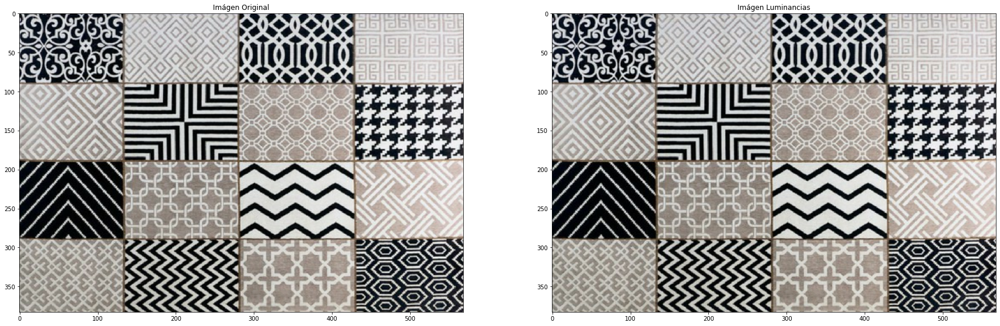

In [11]:
#@title ## Seleccione una imágen, trabajaremos con su Luminancia (Y).
#@markdown Puede utilizar una imágen propia, una previamente procesada o la mía: 
#@markdown ---
#@markdown ### Enter an Image path:
file_path ='/content/Geom1.png'#'/content/pic1.png'
# #@param {type:"string"}
#@markdown ---
Yim=open_img2lum(file_path)
#Abro la img en PNG como un arreglo
#im =open_img(file_path)
im2=open_img(file_path)
plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(im2,'gray')
plt.title('Imágen Original')
plt.subplot(1,2,2)
plt.imshow(Yim,'gray')
plt.title('Imágen Luminancias')



#Segunda parte: Operación morfológica y guardado

Button(description='Guardar Img. Procesada', layout=Layout(height='40px', width='auto'), style=ButtonStyle(but…

Output()

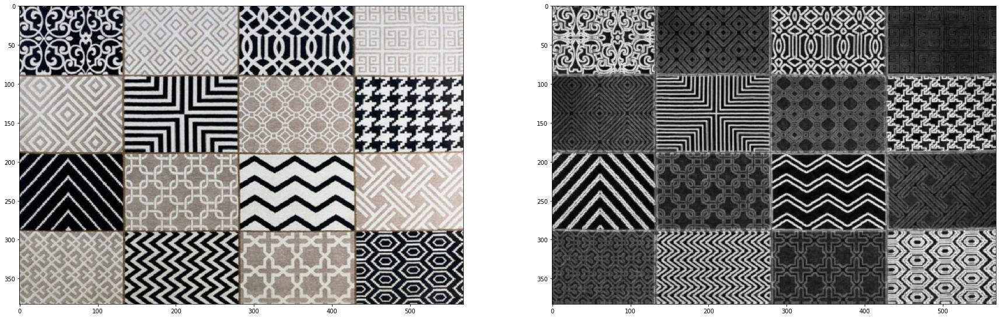

In [5]:
#@title ## Operaciones Morfológicas
#@markdown  Seleccione operación:

Operacion = 'Gradiente' #@param ["'Dilatación 3x3'","'Erosión 3x3'" , "'Apertura'","'Cierre'","'Borde Interior'", "'Borde Exterior'","'Gradiente'","'Top Hat'","'Mediana 3x3'"] {type:"raw"}
OpMorfImg=DoProcesamMorfologico(Operacion,Yim)


plt.figure(figsize=(30, 10))
plt.subplot(1,2,1)
plt.imshow(Yim,'gray')
plt.subplot(1,2,2)
plt.imshow(OpMorfImg,'gray')

#@markdown  Seleccione el nombre de la imágen procesada a guardar:
layout = widgets.Layout(width='auto', height='40px') #set width and height

button = widgets.Button(description="Guardar Img. Procesada",style= {'button_color':'lightblue'},disabled=False,display='flex',flex_flow='column',align_items='center',layout=layout)
output = widgets.Output()

def on_button_clicked(b):
  # Display the message within the output widget.
  with output:
    print("Button clicked.")
    NombreArchivo = 'Img2' #@param {type:"raw"}
    arch=NombreArchivo
    save_img(OpMorfImg,arch)
    print('Imágen guardada en : /content/',arch,'.png')

button.on_click(on_button_clicked)
display(button, output)



#**Análisis**
A continuación se ilustran las operaciones en conjunto para poder observar mejor el efecto de las diferentes operaciones. 


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Top-Hat:Original-Apertura')

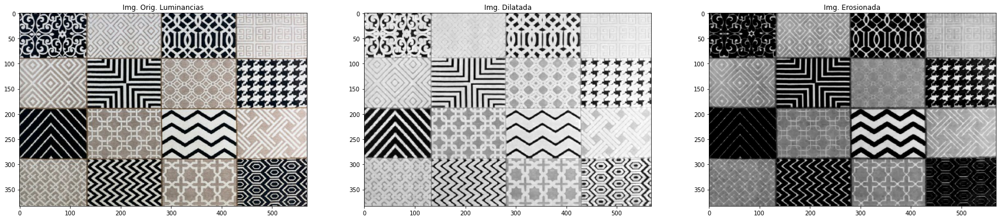

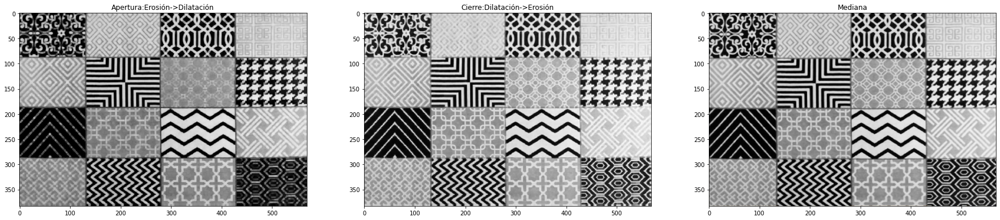

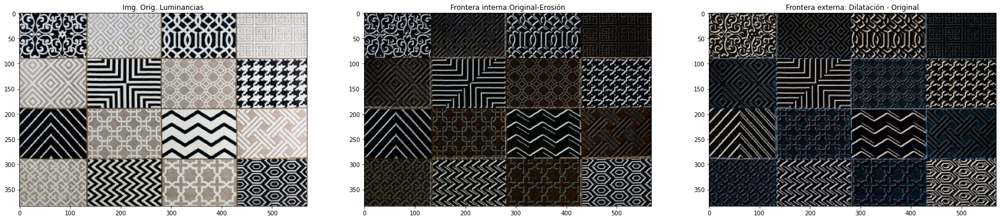

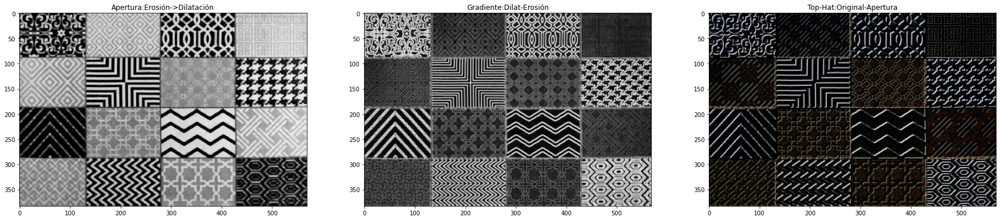

In [7]:

OpMorfImg=DoProcesamMorfologico('Dilatación 3x3',Yim)


plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(Yim,'gray')
plt.title('Img. Orig. Luminancias')

plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Img. Dilatada')

OpMorfImg=DoProcesamMorfologico('Erosión 3x3',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Img. Erosionada')

OpMorfImg=DoProcesamMorfologico('Apertura',Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(OpMorfImg,'gray')
plt.title('Apertura:Erosión->Dilatación')
OpMorfImg=DoProcesamMorfologico('Cierre',Yim)
plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Cierre:Dilatación->Erosión')
OpMorfImg=DoProcesamMorfologico('Mediana 3x3',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Mediana')

OpMorfImg=DoProcesamMorfologico('Borde Interior',Yim)


plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(Yim,'gray')
plt.title('Img. Orig. Luminancias')

plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Frontera interna:Original-Erosión')
OpMorfImg=DoProcesamMorfologico('Borde Exterior',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Frontera externa: Dilatación - Original')

OpMorfImg=DoProcesamMorfologico('Apertura',Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(OpMorfImg,'gray')
plt.title('Apertura:Erosión->Dilatación')
OpMorfImg=DoProcesamMorfologico('Gradiente',Yim)
plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Gradiente:Dilat-Erosión')
OpMorfImg=DoProcesamMorfologico('Top Hat',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Top-Hat:Original-Apertura')



# Imágen binarizada
A continuación se binariza la imágen y se aplican las operaciones.
Tomando un threshold de 0.6 y 0.4, se ve una degradación grande en las partes claras, como es de esperarse. 
Con 0.2 también sucede, pero nos permite igualmente ver el efecto de las operaciones en los cuadros de mayor contraste.

Text(0.5, 1.0, 'Top-Hat:Original-Apertura')

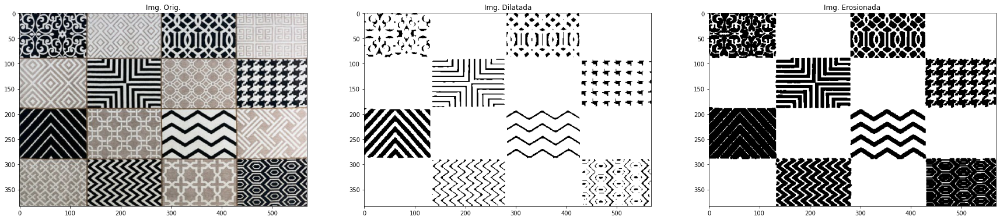

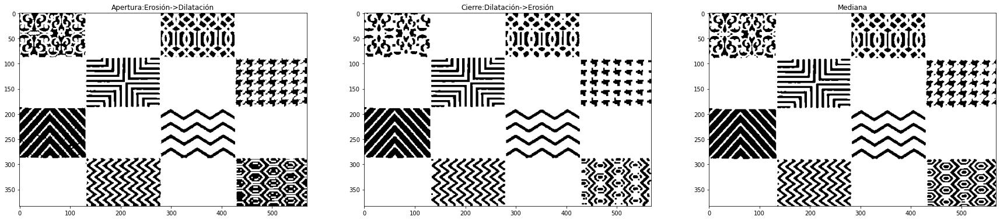

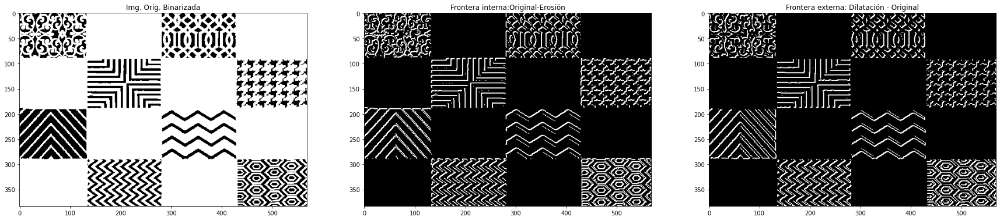

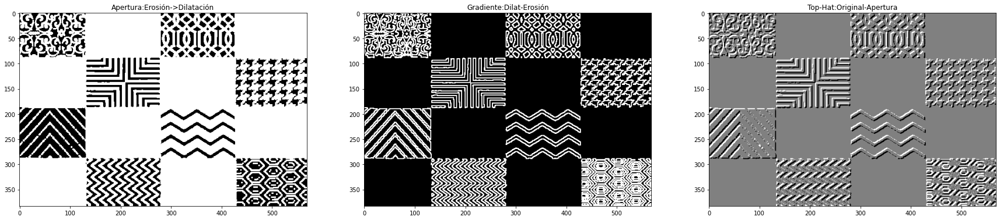

In [14]:
thresh=0.2
Yim=RGB2Y_01(im2,thresh)

OpMorfImg=DoProcesamMorfologico('Dilatación 3x3',Yim)


plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(im2,'gray')
plt.title('Img. Orig.')

plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Img. Dilatada')

OpMorfImg=DoProcesamMorfologico('Erosión 3x3',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Img. Erosionada')

OpMorfImg=DoProcesamMorfologico('Apertura',Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(OpMorfImg,'gray')
plt.title('Apertura:Erosión->Dilatación')
OpMorfImg=DoProcesamMorfologico('Cierre',Yim)
plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Cierre:Dilatación->Erosión')
OpMorfImg=DoProcesamMorfologico('Mediana 3x3',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Mediana')

OpMorfImg=DoProcesamMorfologico('Borde Interior',Yim)


plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(Yim,'gray')
plt.title('Img. Orig. Binarizada')

plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Frontera interna:Original-Erosión')
OpMorfImg=DoProcesamMorfologico('Borde Exterior',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Frontera externa: Dilatación - Original')

OpMorfImg=DoProcesamMorfologico('Apertura',Yim)
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.imshow(OpMorfImg,'gray')
plt.title('Apertura:Erosión->Dilatación')
OpMorfImg=DoProcesamMorfologico('Gradiente',Yim)
plt.subplot(1,3,2)
plt.imshow(OpMorfImg,'gray')
plt.title('Gradiente:Dilat-Erosión')
OpMorfImg=DoProcesamMorfologico('Top Hat',Yim)
plt.subplot(1,3,3)
plt.imshow(OpMorfImg,'gray')
plt.title('Top-Hat:Original-Apertura')
